# Crime Rates in Philadelphia
By Tianyi Chris Bi and Jai Bock Lee

#### Motivation

Our team wanted to model and analyze the criminal activity occuring in Philadelphia according to crime report data from OpenDataPhilly. Crime reports contain data that we believe could be analyzed to predict future crime rates in Philadelphia.

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.basemap import Basemap
from IPython.display import HTML
from matplotlib.ticker import FuncFormatter
from pylab import rcParams
from matplotlib import animation

%matplotlib inline

#### Read data sort by date

In [2]:
df = pd.read_csv('crime.csv')
df = df[df.Dispatch_Date != '2016-12-01']
date = pd.to_datetime(df['Dispatch_Date_Time'])
df.sort_values(by='Dispatch_Date_Time', inplace=True)
df.index = np.array(range(df.shape[0]))
date = pd.to_datetime(df['Dispatch_Date_Time'])
df['all_hour'] = abs(date - date[0]).dt.total_seconds() / 3600.0

In [3]:
df.head()

,Dc_Dist,Psa,Dispatch_Date_Time,Dispatch_Date,Dispatch_Time,Hour,Dc_Key,Location_Block,UCR_General,Text_General_Code,Police_Districts,Month,Lon,Lat,all_hour
0,3,I,2006-01-01 00:00:00,2006-01-01,00:00:00,0,200603000002,S 8TH ST /SOUTH ST,2600.0,All Other Offenses,3.0,2006-01,-75.155491,39.942416,0.000000
1,3,I,2006-01-01 00:02:00,2006-01-01,00:02:00,0,200603000001,S 8TH ST /SOUTH ST,2600.0,All Other Offenses,3.0,2006-01,-75.155491,39.942416,0.033333
2,19,R,2006-01-01 00:02:00,2006-01-01,00:02:00,0,200619000047,5500 BLOCK CHERRY ST,800.0,Other Assaults,15.0,2006-01,-75.231975,39.963220,0.033333
3,18,Q,2006-01-01 00:04:00,2006-01-01,00:04:00,0,200618000007,400 BLOCK S 55TH ST,1500.0,Weapon Violations,14.0,2006-01,-75.232374,39.953490,0.066667
4,12,P,2006-01-01 00:05:00,2006-01-01,00:05:00,0,200612000011,1700 BLOCK S 58TH ST,1500.0,Weapon Violations,9.0,2006-01,-75.230711,39.937644,0.083333


#### Crimes per day, month, year

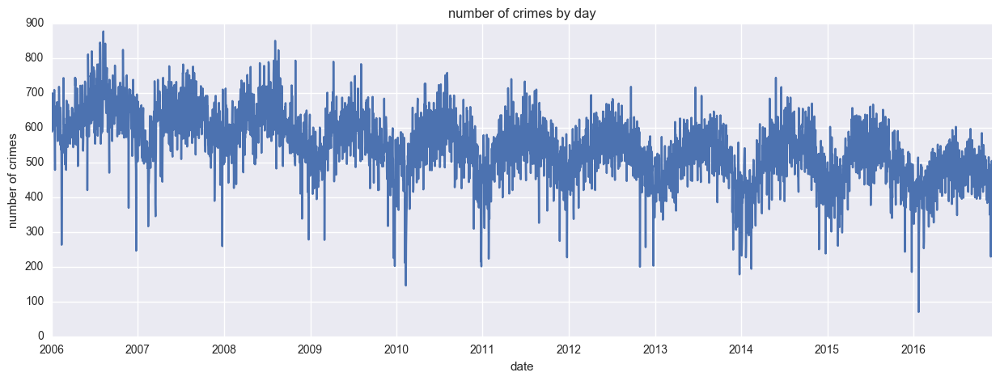

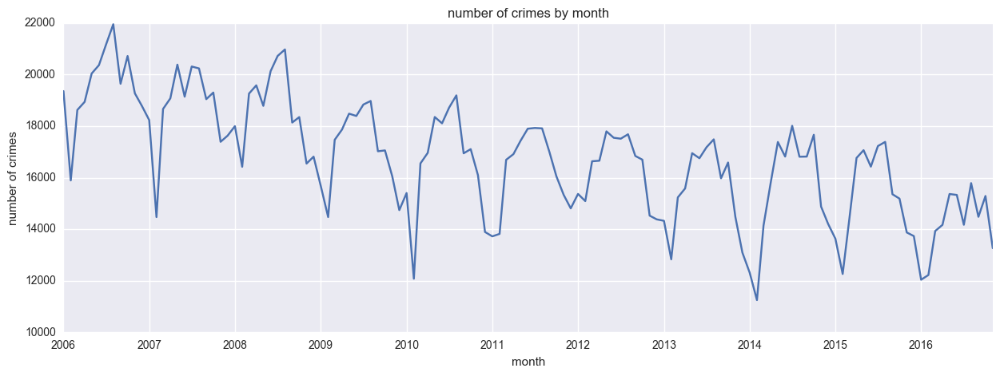

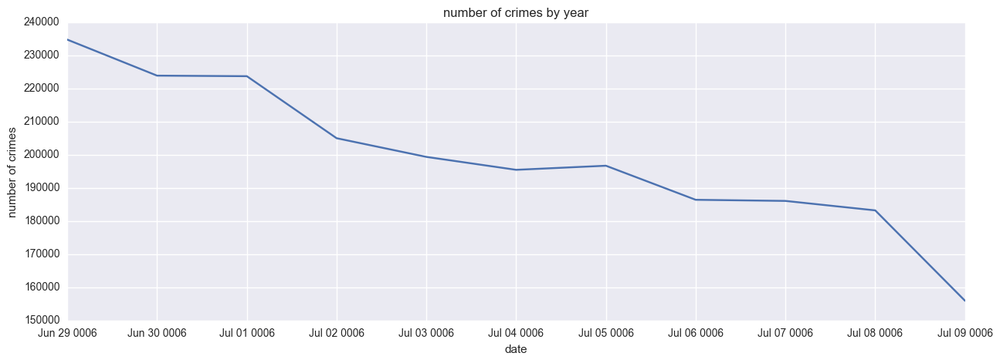

In [4]:
df['month'] = date.dt.month
df['year'] = date.dt.year
df['day'] = date.dt.day
Group = df.groupby(['year', 'month', 'day'])['day'].count()
Count = Group.to_frame(name='count').reset_index()
fig, ax = plt.subplots(figsize=(15,5))
ax.plot_date(pd.to_datetime(df.Dispatch_Date).unique(), Count['count'], '-')
ax.set_ylabel('number of crimes')
ax.set_xlabel('date')
ax.set_title('number of crimes by day')

Group = df.groupby(['year', 'month'])['month'].count()
Count = Group.to_frame(name='count').reset_index()
fig, ax = plt.subplots(figsize=(15,5))
ax.plot_date(pd.to_datetime(df.Month).unique(), Count['count'], '-')
ax.set_ylabel('number of crimes')
ax.set_xlabel('month')
ax.set_title('number of crimes by month')

Group = df.groupby(['year'])['year'].count()
Count = Group.to_frame(name='count').reset_index()
fig, ax = plt.subplots(figsize=(15,5))
ax.plot_date(df.year.unique(), Count['count'], '-')
ax.set_ylabel('number of crimes')
ax.set_xlabel('date')
ax.set_title('number of crimes by year')

On the chart of crimes by day visible seasonality.
From the graph of the crimes by months of visible frequency, in summer, is made considerably more crimes than in the winter.
Looking at the total number of crimes per year from 2006 to 2015, it is clear that the total number of crimes is decreasing every year.

#### Crimes per year in each Police District, 2006-2015

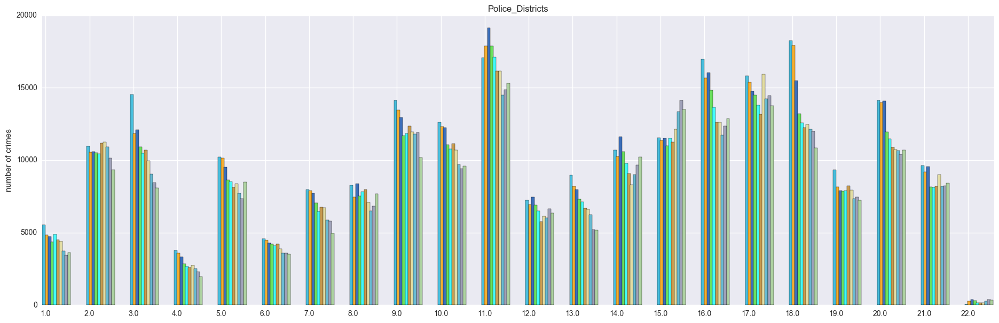

In [5]:
color = np.random.rand(df.Police_Districts.value_counts(sort = False).shape[0], 3)
c = 0
rcParams['figure.figsize'] = 23, 7
for i in range(2006, 2016): 
    crimes = np.array(df.Police_Districts[df.year == i].value_counts(sort= False))
    N = crimes.shape[0]
    ind = np.arange(N)*1.2    
    width = 0.085
    p1 = plt.bar(ind + width*c*0.9, crimes, width, color= color[c])
    plt.ylabel('number of crimes')
    plt.title('Police_Districts')
    plt.xticks(ind+width, df.Police_Districts[df.year == 2006].value_counts(sort= False).index)
    plt.axis([0, 26, 0.0, 20000])
    c += 1

plt.show()

#### Crimes per year based on Text_General_Code, 2006-15

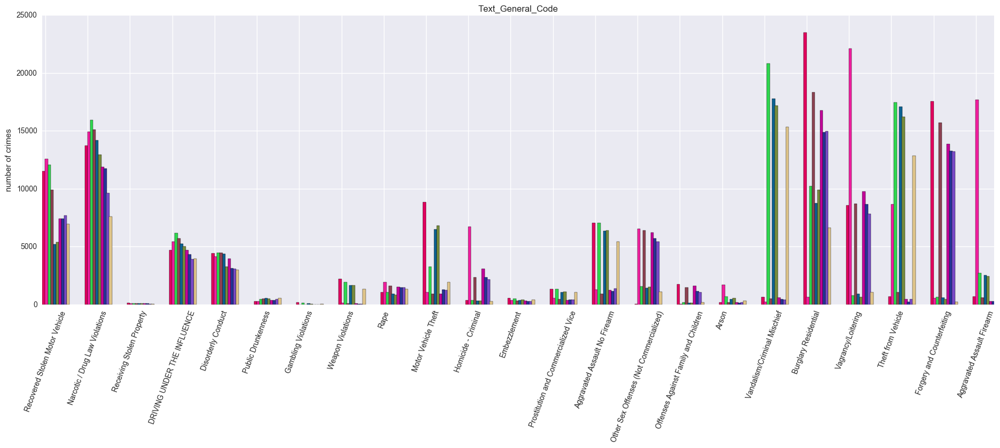

In [6]:
color = np.random.rand(df.Text_General_Code.value_counts(sort= False).shape[0], 3)
c = 0
rcParams['figure.figsize'] = 23, 7
fig, ax = plt.subplots()
for i in range(2006, 2016):
    crimes = np.array(df.Text_General_Code[df.year == i].value_counts(sort= False))
    N = crimes.shape[0]
    ind = np.arange(N)*1.2    
    width = 0.085
    p1 = plt.bar(ind + width*c*0.9, crimes, width, color= color[c])
    plt.ylabel('number of crimes')
    plt.title('Text_General_Code')
    plt.xticks(ind+width, df.Text_General_Code[df.year == i].value_counts(sort= False).index, rotation = 70)
    plt.axis([0, 27, 0.0, 25000])
    c += 1

plt.show()


Some Text_General_Code acting weird

#### Crimes in a month per year

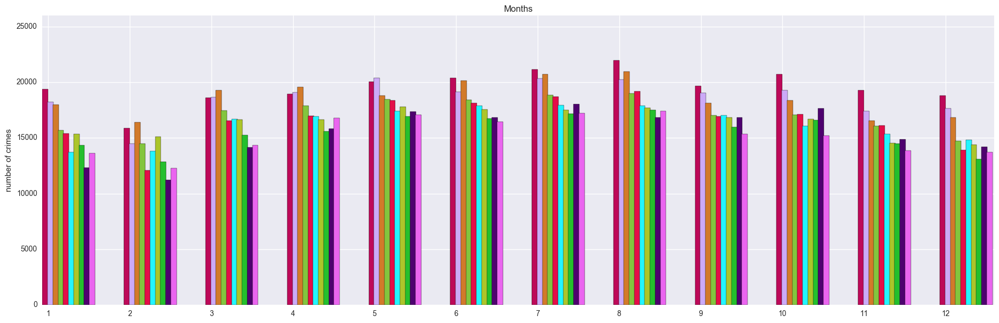

In [7]:
color = np.random.rand(df.month.value_counts(sort= False).shape[0], 3)
c = 0
rcParams['figure.figsize'] = 23, 7
fig, ax = plt.subplots()
for i in range(2006, 2016):
    crimes = np.array(df.month[df.year == i].value_counts(sort= False))
    N = crimes.shape[0]
    ind = np.arange(N)*1.2    
    width = 0.085
    p1 = plt.bar(ind + width*c*0.9, crimes, width, color= color[c])
    plt.ylabel('number of crimes')
    plt.title('Months')
    plt.xticks(ind+width, df.month[df.year == i].value_counts(sort= False).index)
    plt.axis([0, 14, 0.0, 26000])
    c += 1

plt.show()


From this data, we can see that more crimes happen in the summer than winter, and overall crime is decreasing every year.

#### Crimes in an hour per year

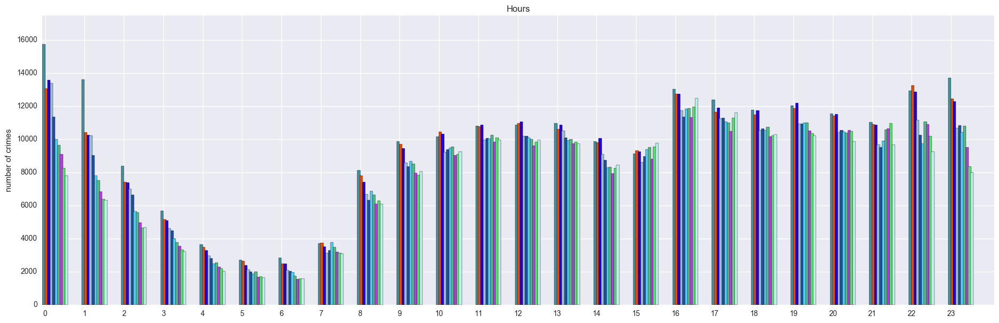

In [8]:
color = np.random.rand(df.Hour.value_counts(sort= False).shape[0], 3)
c = 0
rcParams['figure.figsize'] = 23, 7
fig, ax = plt.subplots()
for i in range(2006, 2016):  
    crimes = np.array(df.Hour[df.year == i].value_counts(sort= False))
    N = crimes.shape[0]
    ind = np.arange(N)*1.2    
    width = 0.085
    p1 = plt.bar( ind + width*c*0.9, crimes, width, color= color[c])
    plt.ylabel('number of crimes')
    plt.title('Hours')
    plt.xticks(ind+width, df.Hour[df.year == i].value_counts(sort= False).index)
    plt.axis([0, 29, 0.0, 17500])
    c += 1

plt.show()


#### Let's see how crimes are distributed on the map.

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-75.277728,39.869991,-74.957504,40.137895&bboxSR=4269&imageSR=4269&size=3000,2509&dpi=96&format=png32&f=image


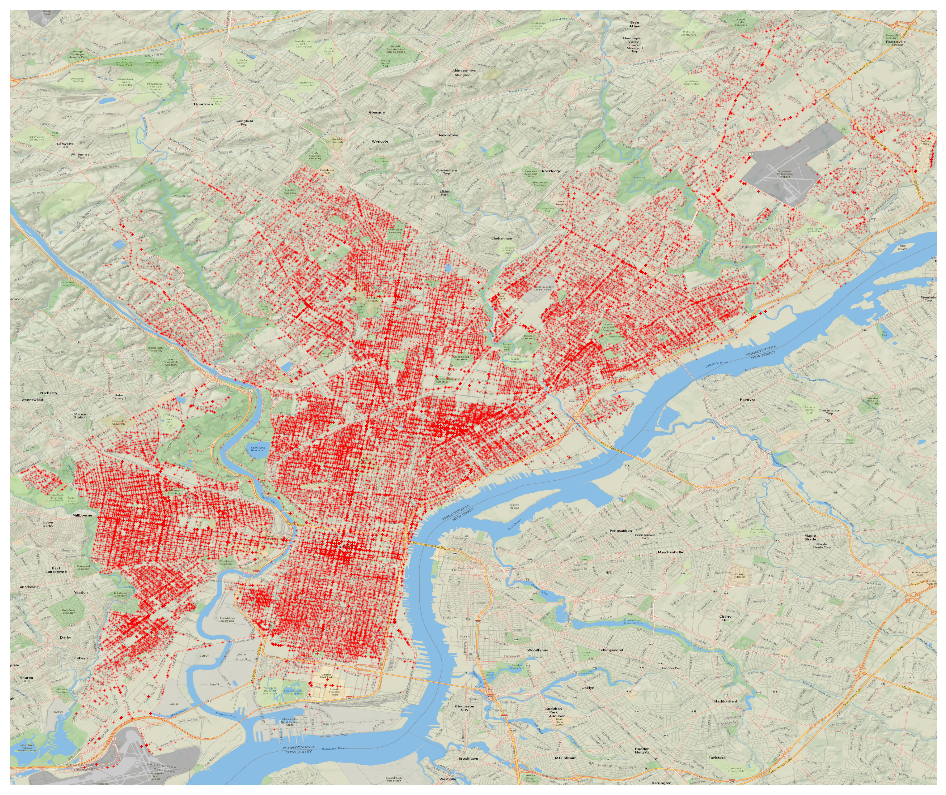

In [9]:
m = Basemap(projection='mill', llcrnrlat=df.Lat.min(), urcrnrlat=df.Lat.max(), 
            llcrnrlon=df.Lon.min(), urcrnrlon=df.Lon.max(), resolution='c', epsg=4269)
x, y = m(tuple(df.Lon[(df.Lon.isnull()==False) & (df.year == 2015)]), \
         tuple(df.Lat[(df.Lat.isnull() == False) & (df.year == 2015)]))

plt.figure(figsize=(20,10))
m.arcgisimage(service="NatGeo_World_Map", xpixels=3000, verbose=True)
m.plot(x,y,'ro',markersize=1, alpha=.3 )

In [10]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "http://planphilly.com/uploads/media_items/http-planphilly-com-sites-planphilly-com-files-pop_density2-jpg.752.947.s.jpg")

It is seen that crime tends to similarly match population density in various areas.

### Police Districts

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-75.277728,39.869991,-74.957504,40.137895&bboxSR=4269&imageSR=4269&size=3000,2509&dpi=96&format=png32&f=image


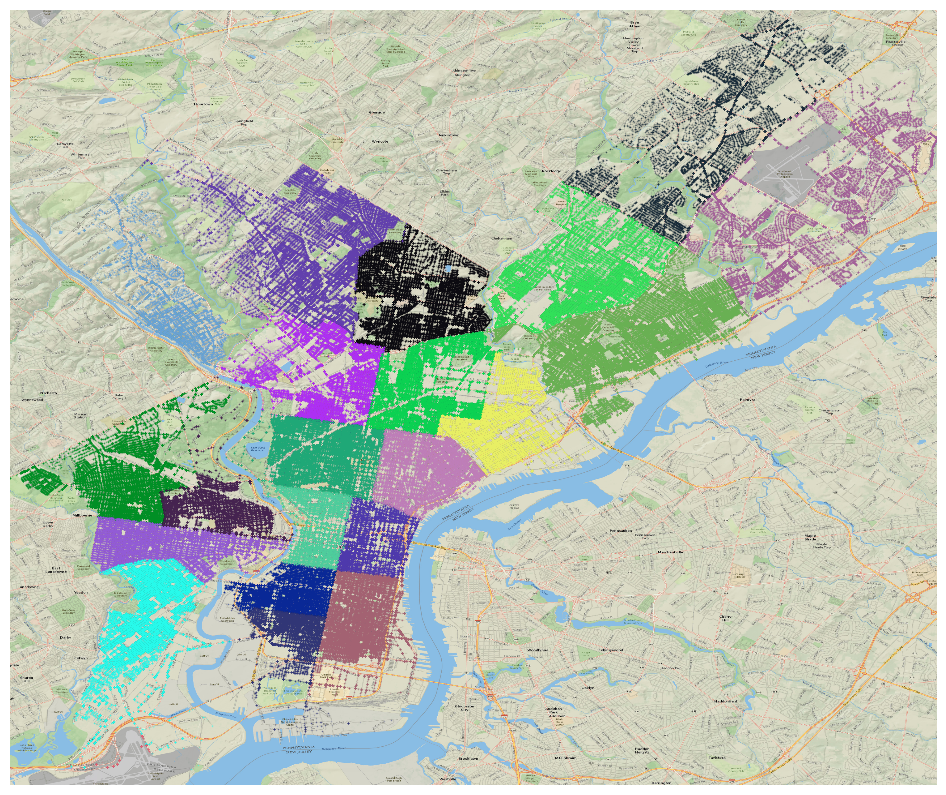

In [11]:
color = np.random.rand(df.Police_Districts.unique().shape[0], 3)
plt.figure(figsize=(20,10))
m = Basemap(projection='mill', llcrnrlat=df.Lat.min(), urcrnrlat=df.Lat.max(), 
            llcrnrlon=df.Lon.min(), urcrnrlon=df.Lon.max(), resolution='c', epsg=4269)
m.arcgisimage(service="NatGeo_World_Map", xpixels=3000, verbose=True)
c = 0
for i in df.Police_Districts.unique():
    x, y = m(tuple(df.Lon[(df.Lon.isnull()==False) & (df.Police_Districts == i)]), \
         tuple(df.Lat[(df.Lat.isnull() == False) & (df.Police_Districts == i)]))

    m.plot(x,y,'ro',markersize=1,alpha=.3, color = color[c] )

    c += 1

### Police Service Areas

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-75.277728,39.869991,-74.957504,40.137895&bboxSR=4269&imageSR=4269&size=3000,2509&dpi=96&format=png32&f=image


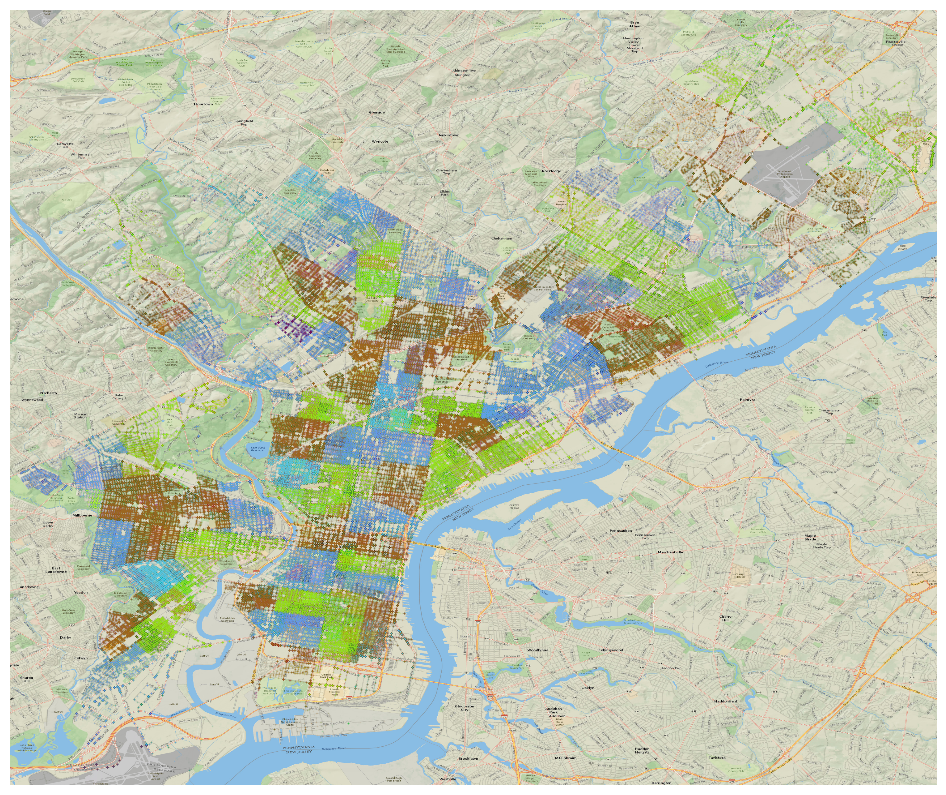

In [12]:
color = np.random.rand(df.Psa.unique().shape[0], 3)

plt.figure(figsize=(20,10))
m = Basemap(projection='mill', llcrnrlat=df.Lat.min(), urcrnrlat=df.Lat.max(), 
            llcrnrlon=df.Lon.min(), urcrnrlon=df.Lon.max(), resolution='c', epsg=4269)
m.arcgisimage(service="NatGeo_World_Map", xpixels=3000, verbose=True)
c = 0
for i in df.Psa.unique():
    x, y = m(tuple(df.Lon[(df.Lon.isnull()==False) & (df.Psa == i)]), \
         tuple(df.Lat[(df.Lat.isnull() == False) & (df.Psa == i)]))

    m.plot(x,y,'ro',markersize=1, alpha = 0.1, color = color[c] )
    c += 1

In [13]:
df_psa = pd.read_csv('Boundaries_PSA.csv')
df_psa.head()

,﻿OBJECTID,AREA,PERIMETER,PSACOV_,PSACOV_ID,ID,DISTRICT__,PSA_NUM,OLD_SECTOR,DESCRIPT
0,1,NaN,NaN,NaN,NaN,1,NaN,77,A,
1,2,NaN,NaN,NaN,NaN,2,NaN,11,"A,B,C,D,E,F,J",
2,3,NaN,NaN,NaN,NaN,3,NaN,12,"G,H,I,K,L,M,N",
3,4,NaN,NaN,NaN,NaN,4,NaN,21,"G,H,I,K,L,N,S",Tyson to Adams - Roosevelt to Algon
4,5,NaN,NaN,NaN,NaN,5,NaN,22,"I,J,M,N,O,P,R",Tyson to Tookeny Creek - Algon to Newtown


In [14]:
df_psa.shape

(66, 10)

In [15]:
df_pd = pd.read_csv('Boundaries_District.csv')
df_pd.head()

,﻿OBJECTID,AREA,PERIMETER,DISTRICT_,DISTRICT_ID,DIST_NUM,SUM_AREA,DIST_NUMC,LOCATION,PHONE,DIV_CODE,AREA_SQMI
0,321,NaN,81903.641825,1,NaN,1,NaN,1,24th St. & Wolf St.,686-3010,SPD,2.163501e+08
1,322,NaN,63587.369399,2,NaN,2,NaN,2,Harbison Ave. & Levick St.,686-3020,NEPD,1.923461e+08
2,323,NaN,55305.496227,3,NaN,3,NaN,3,11th St. & Wharton St.,686-3030,SPD,1.839049e+08
3,324,NaN,71919.797243,5,NaN,5,NaN,5,Ridge Ave. & Cinnaminson St.,686-3050,NWPD,2.130442e+08
4,325,NaN,34655.320856,6,NaN,6,NaN,6,11th St. & Winter St.,686-3060,CPD,6.927927e+07


### District/PoliceHQ

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-75.277728,39.869991,-74.957504,40.137895&bboxSR=4269&imageSR=4269&size=3000,2509&dpi=96&format=png32&f=image


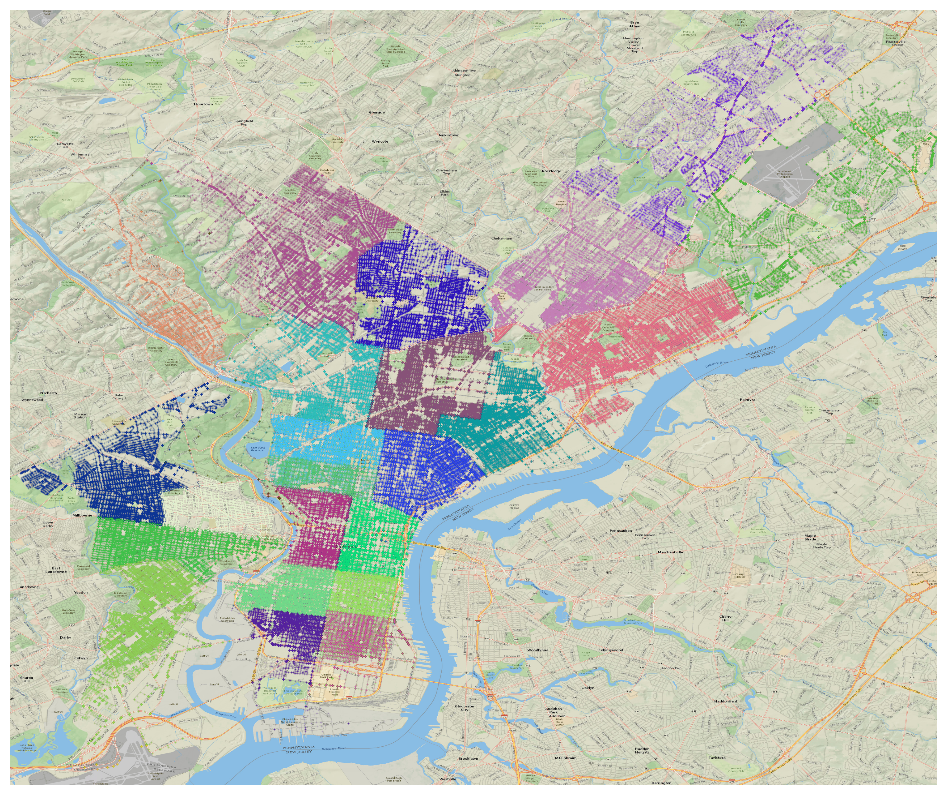

In [16]:
color = np.random.rand(df.Dc_Dist.unique().shape[0], 3)

plt.figure(figsize=(20,10))
m = Basemap(projection='mill', llcrnrlat=df.Lat.min(), urcrnrlat=df.Lat.max(), 
            llcrnrlon=df.Lon.min(), urcrnrlon=df.Lon.max(), resolution='c', epsg=4269)
m.arcgisimage(service="NatGeo_World_Map", xpixels=3000, verbose=True)
c = 0
for i in df.Dc_Dist.unique():
    x, y = m(tuple(df.Lon[(df.Lon.isnull()==False) & (df.Dc_Dist == i)]), \
         tuple(df.Lat[(df.Lat.isnull() == False) & (df.Dc_Dist == i)]))

    m.plot(x,y,'ro',markersize=1, alpha = 0.1, color = color[c] )
    c += 1

The map shows how crimes are divided based on the Police HQ.

### Animation

http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/export?bbox=-75.277728,39.869991,-74.957504,40.137895&bboxSR=4269&imageSR=4269&size=3000,2509&dpi=96&format=png32&f=image


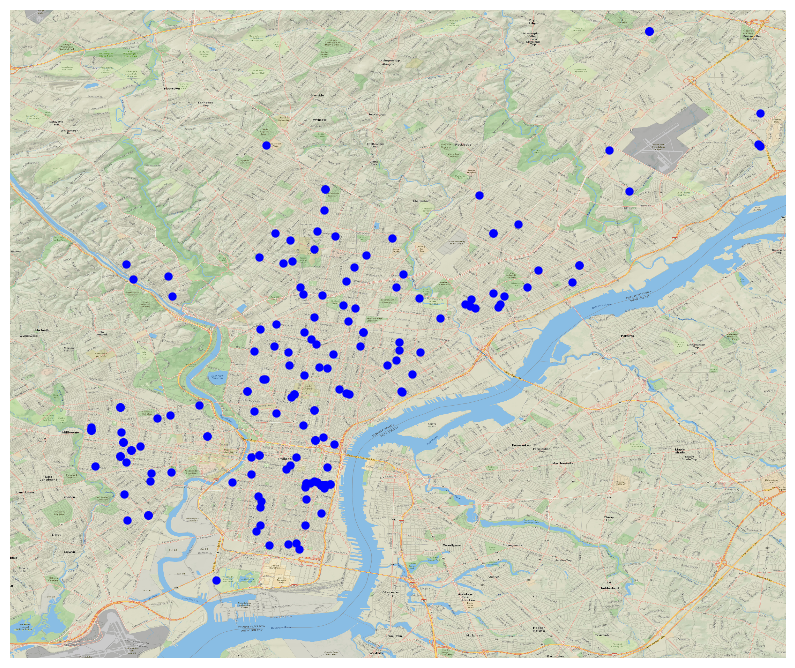

In [17]:
import numpy as np
import matplotlib.pylab as plt
from matplotlib.animation import FuncAnimation

fig = plt.gcf()
plt.figure(figsize=(10,9))

m = Basemap(projection='mill', llcrnrlat=df.Lat.min(), urcrnrlat=df.Lat.max(),\
             llcrnrlon=df.Lon.min(), urcrnrlon=df.Lon.max(), resolution='c', epsg=4269)

x, y = m(df.Lon[(df.Lon.isnull()==False) ], \
        df.Lat[(df.Lat.isnull() == False)])

m.arcgisimage(service="NatGeo_World_Map", xpixels=3000, verbose=True)

a, b = m(df.Lon.min(), df.Lat.min())
graph = m.plot(a, b, 'ro', markersize=6, alpha = 1.0)[0]

all_hour = df.all_hour[(df.Lon.isnull()==False) ] 
def animate(i):
    lons = x[(all_hour < i+4) & (all_hour >= i) ]

    lats = y[(all_hour < i+4) & (all_hour >= i) ]
    graph.set_data(lons, lats)
    if (i % 24 >=23) | (i % 24 <= 7):
        graph.set_color('b')
    else:
        graph.set_color('r')
    return graph
anim = FuncAnimation(plt.gcf(), animate, repeat=True, frames=500, interval=500)

In [18]:
from IPython.display import HTML
HTML(anim.to_html5_video())

### Predictions

In [19]:
Group = df.groupby(['year', 'month', 'day', 'Dispatch_Date'])['day'].count()
monthlyCount = Group.to_frame(name='count').reset_index()
monthlyCount.set_index(pd.to_datetime(monthlyCount['Dispatch_Date']), inplace = True)
monthlyCount = monthlyCount['count']
monthlyCount.head()

Dispatch_Date
2006-01-01    606
2006-01-02    589
2006-01-03    629
2006-01-04    699
2006-01-05    594
Name: count, dtype: int64

C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:5: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:6: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()


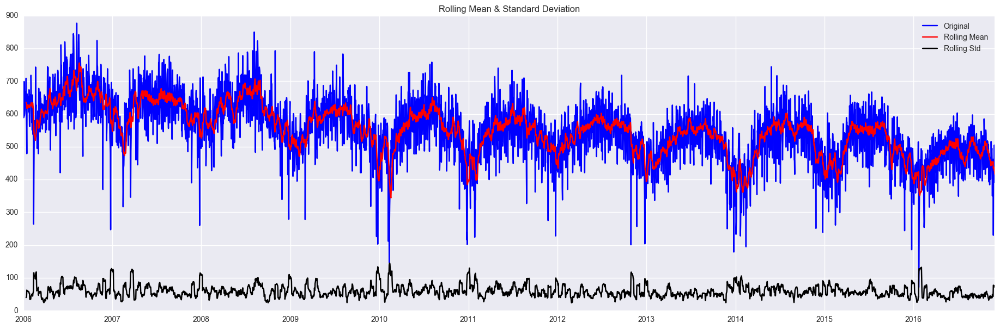

Results of Dickey-Fuller Test:
Test Statistic                   -3.024611
p-value                           0.032659
#Lags Used                       29.000000
Number of Observations Used    3957.000000
Critical Value (5%)              -2.862271
Critical Value (1%)              -3.432004
Critical Value (10%)             -2.567159
dtype: float64


In [20]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print 'Results of Dickey-Fuller Test:'
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print dfoutput

    

test_stationarity(monthlyCount)

Since we can see the mean is decreasing overall, we think this one is not a stationary.  You can see there is a clear negative trend in the data set.  Since we want to make better prediction, we used a log transformation to reduce.

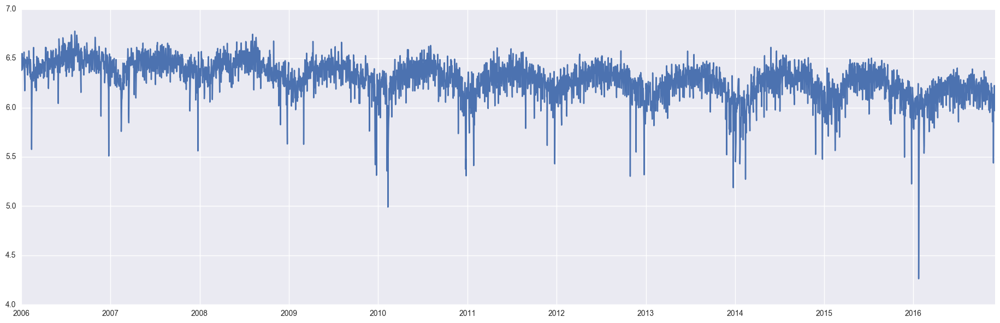

In [21]:
monthly_log = np.log(monthlyCount)
plt.plot(monthly_log)

C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  if __name__ == '__main__':


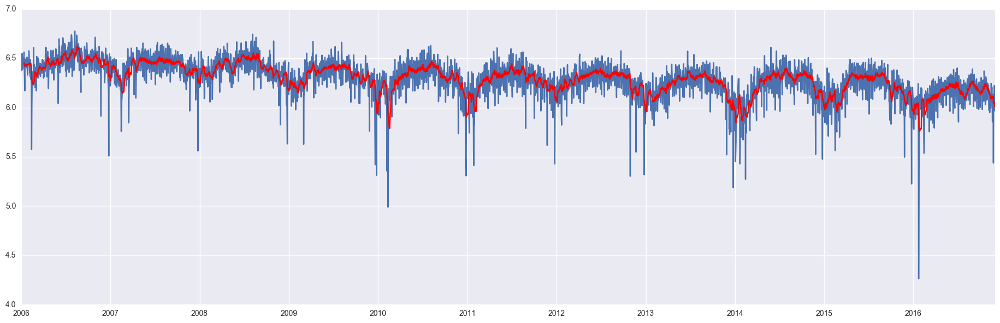

In [22]:
moving_avg = pd.rolling_mean(monthly_log,12)
plt.plot(monthly_log)
plt.plot(moving_avg, color='red')

C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:5: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
C:\Program Files\Anaconda2\lib\site-packages\ipykernel\__main__.py:6: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()


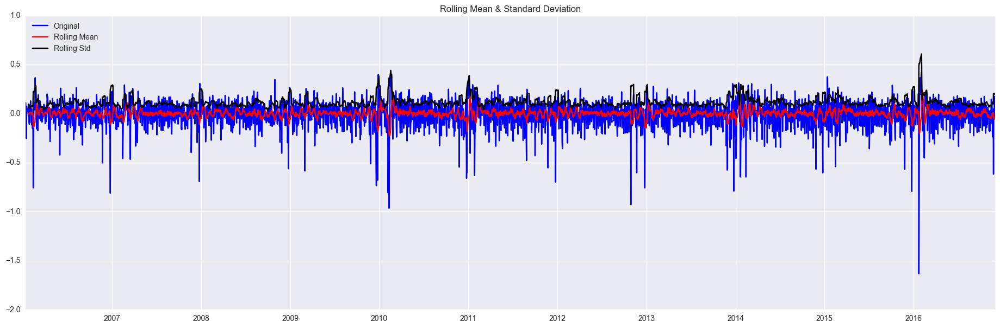

Results of Dickey-Fuller Test:
Test Statistic                -1.405101e+01
p-value                        3.177524e-26
#Lags Used                     2.900000e+01
Number of Observations Used    3.946000e+03
Critical Value (5%)           -2.862273e+00
Critical Value (1%)           -3.432008e+00
Critical Value (10%)          -2.567160e+00
dtype: float64


In [23]:
monthly_log_moving_avg_diff = monthly_log - moving_avg
#monthly_log_moving_avg_diff = monthly_log - monthly_log.shift()
monthly_log_moving_avg_diff.dropna(inplace=True)
test_stationarity(monthly_log_moving_avg_diff)

At this point we can see the test static is lower than the 1% critical value, therefore we could say our confidence rate is decently high.  We also tried the exponential moving average, but the confidence rate is not high as this one.

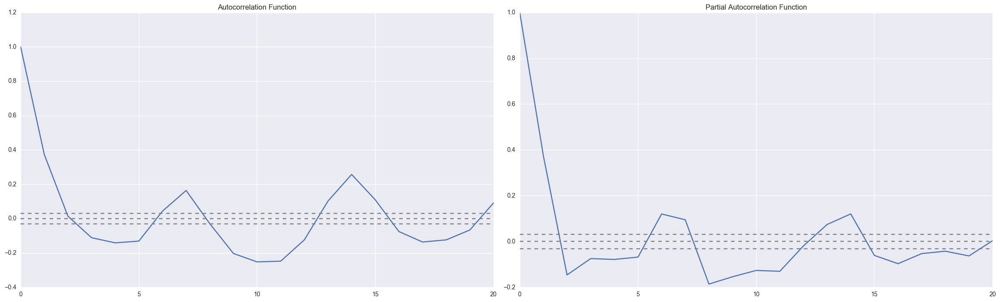

In [24]:
from statsmodels.tsa.stattools import acf, pacf
lag_acf = acf(monthly_log_moving_avg_diff, nlags=20)
lag_pacf = pacf(monthly_log_moving_avg_diff, nlags=20, method='ols')

#Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(monthly_log_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(monthly_log_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(monthly_log_moving_avg_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(monthly_log_moving_avg_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [25]:
from statsmodels.tsa.arima_model import ARIMA

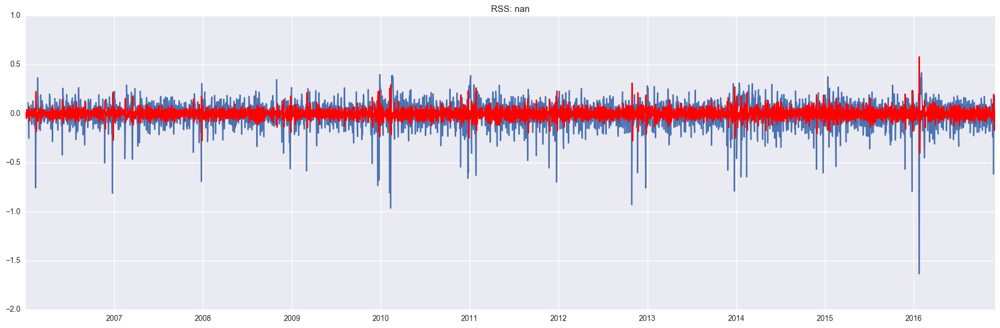

In [26]:
# AR model
model = ARIMA(monthly_log, order=(2, 1, 0))  
results_AR = model.fit(disp=-1)  
plt.plot(monthly_log_moving_avg_diff)
plt.plot(results_AR.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR.fittedvalues - monthly_log_moving_avg_diff)**2))

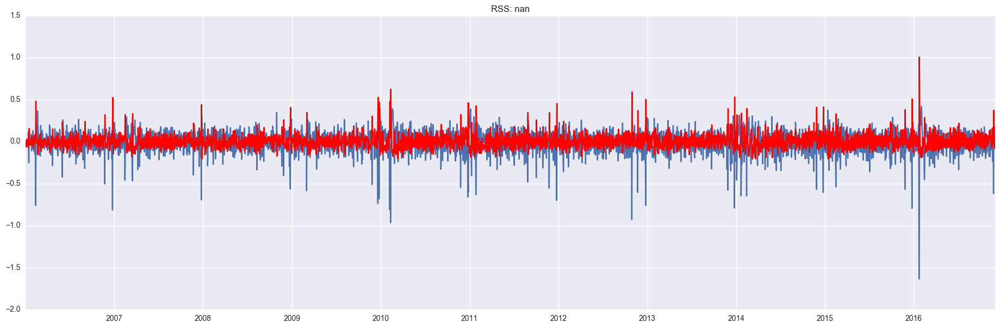

In [27]:
# MA model
model = ARIMA(monthly_log, order=(0, 1, 2))  
results_MA = model.fit(disp=-1)  
plt.plot(monthly_log_moving_avg_diff)
plt.plot(results_MA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA.fittedvalues - monthly_log_moving_avg_diff)**2))

C:\Program Files\Anaconda2\lib\site-packages\statsmodels\base\model.py:466: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


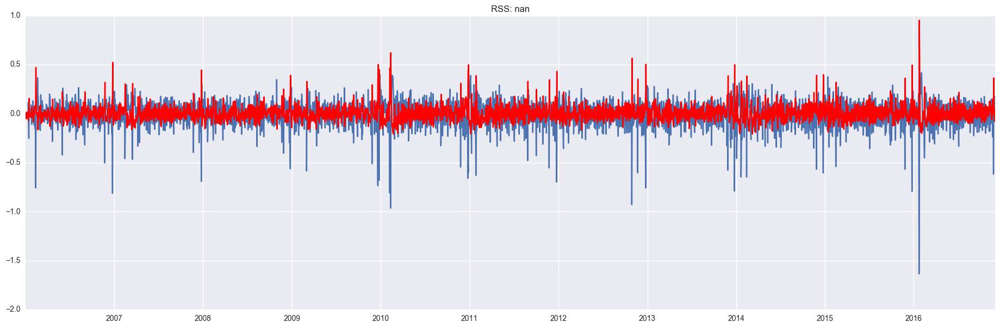

In [28]:
# ARIMA model
model = ARIMA(monthly_log, order=(2, 1, 2))  
results_ARIMA = model.fit(disp=-1)  
plt.plot(monthly_log_moving_avg_diff)
plt.plot(results_ARIMA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA.fittedvalues - monthly_log_moving_avg_diff)**2))

In [29]:
predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
predictions_ARIMA_diff.head()

Dispatch_Date
2006-01-02   -0.000094
2006-01-03    0.006527
2006-01-04   -0.012052
2006-01-05   -0.052828
2006-01-06    0.009064
dtype: float64

In [30]:
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
predictions_ARIMA_diff_cumsum.head()

Dispatch_Date
2006-01-02   -0.000094
2006-01-03    0.006433
2006-01-04   -0.005620
2006-01-05   -0.058448
2006-01-06   -0.049383
dtype: float64

In [31]:
predictions_ARIMA_log = pd.Series(monthly_log.ix[0], index=monthly_log.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum,fill_value=0)
predictions_ARIMA_log.head()

Dispatch_Date
2006-01-01    6.406880
2006-01-02    6.406786
2006-01-03    6.413313
2006-01-04    6.401260
2006-01-05    6.348432
dtype: float64

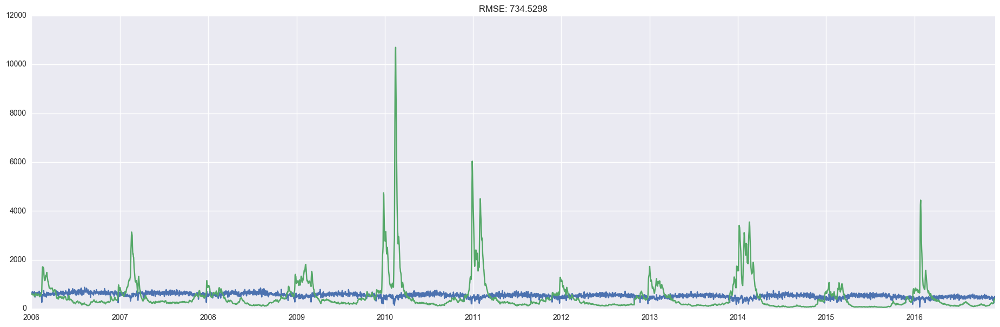

In [32]:
predictions_ARIMA = np.exp(predictions_ARIMA_log)
plt.plot(monthlyCount)
plt.plot(predictions_ARIMA)
plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA-monthlyCount)**2)/len(monthlyCount)))